# Advanced Lane Finding Project

## 1. Compute the camera calibration matrix and distortion coefficients given a set of chessboard images

### Calibrate the camera using chessboard images

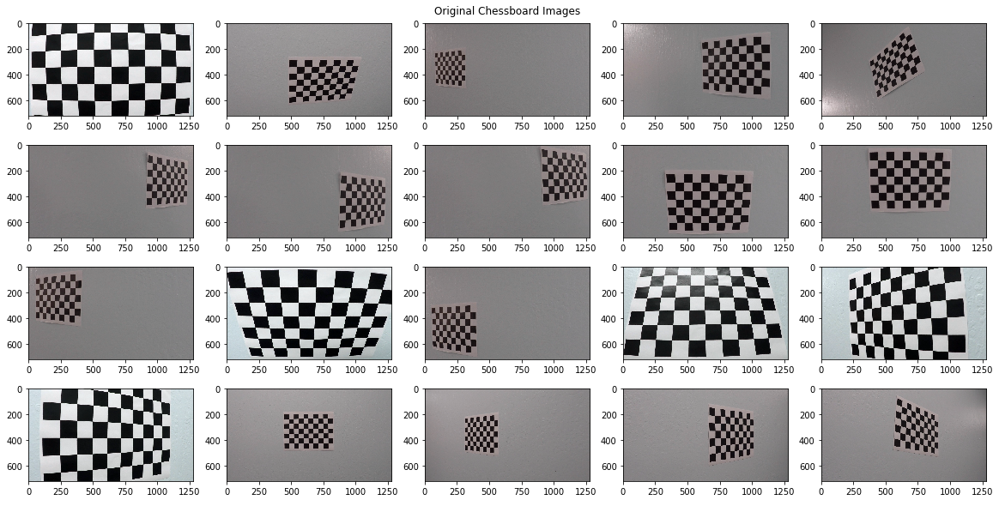

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib inline

# List of calibration images
calibration_img_fnames = glob.glob('./camera_cal/calibration*.jpg')


# Show the chessboard images
chess_imgs_grid = plt.figure(figsize=(20, 10))
plt.title('Original Chessboard Images')
plt.axis('off')
current_pos = 1
columns = 5
rows = 4

for file in calibration_img_fnames:
    img = cv2.imread(file)
    chess_imgs_grid.add_subplot(rows, columns, current_pos)
    plt.imshow(img)
    current_pos += 1    
plt.show()

### Find the chessboard corners and draw them

Unable to find corners for image: [ 1 ]
Unable to find corners for image: [ 15 ]
Unable to find corners for image: [ 16 ]


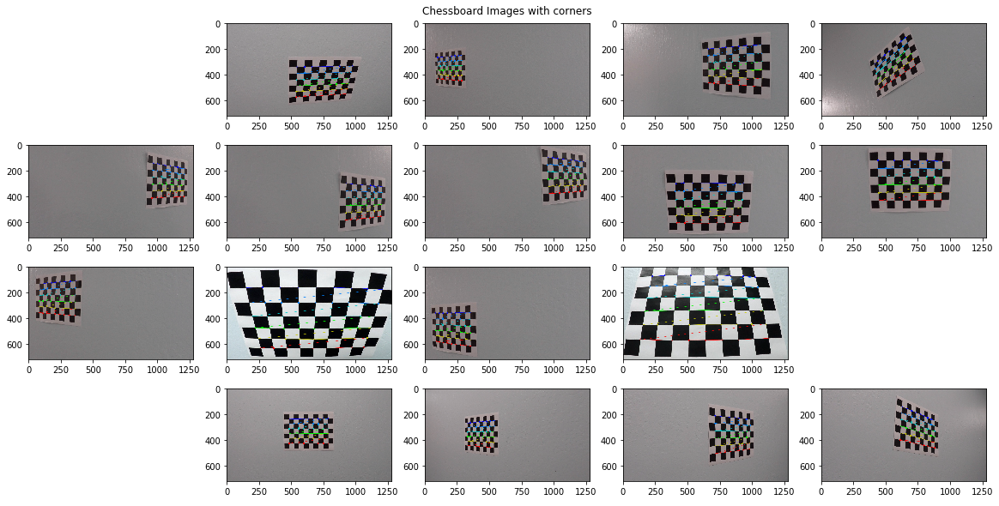

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to stores object and image points for all images
objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

# Make a grid figure to display the images with the corners (when found) so that all the images can be shown at once
chess_imgs_with_corners_grid = plt.figure(figsize=(20, 10))
plt.title('Chessboard Images with corners')
plt.axis('off')
current_pos = 1
columns = 5
rows = 4

# Find the chessboard corners and show them for each calibration image
for file in calibration_img_fnames:
    img = cv2.imread(file)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    
    # Find the chesboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)
    
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
    
        # Draw and add the images with the chessboard corners drawn to the bigger figure
        img = cv2.drawChessboardCorners(img, (9, 6), corners, ret)
        
        chess_imgs_with_corners_grid.add_subplot(rows, columns, current_pos)        
        plt.imshow(img)
    else:
        print('Unable to find corners for image: [ %s ]' % current_pos)
    current_pos += 1
plt.show()

### Calibrate the camera and show the calibration images undistorted

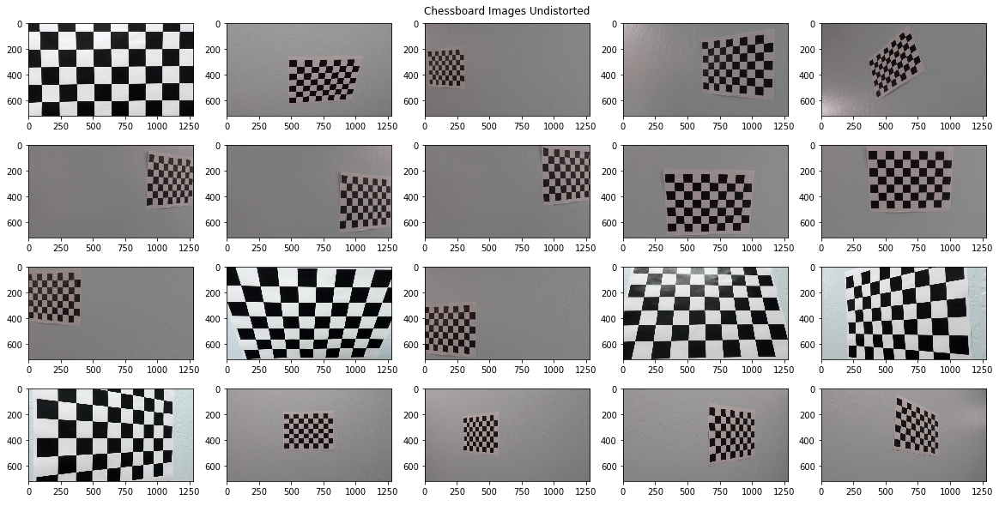

In [3]:
# Calculate camera matrix, distorition coefficents, rotation vectors, and translation vectors
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# Make a grid figure to display the undistored calibration images so that all the images can be shown at once
chess_imgs_undistorted_grid = plt.figure(figsize=(20, 10))
plt.title('Chessboard Images Undistorted')
plt.axis('off')
current_pos = 1
columns = 5
rows = 4

for file in calibration_img_fnames:
    img = cv2.imread(file)
    img_undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    chess_imgs_undistorted_grid.add_subplot(rows, columns, current_pos)
    plt.imshow(img_undistorted)
    current_pos += 1
  
plt.show()
    

## 2. Apply a distortion correction to raw images.

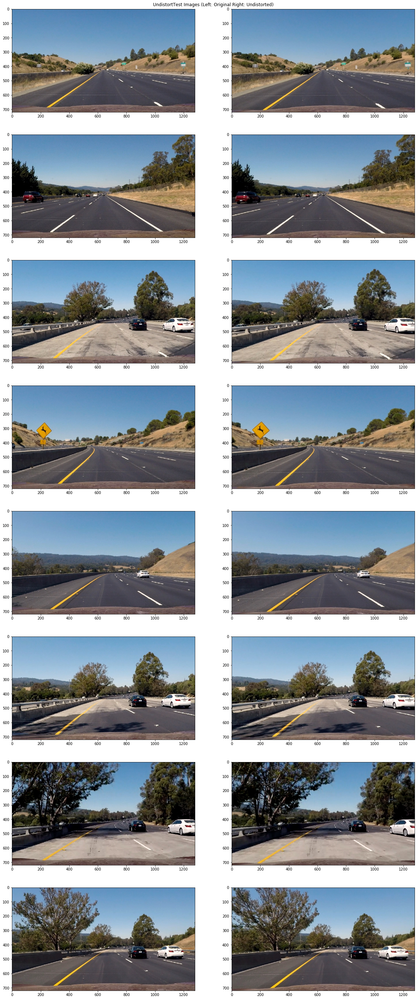

In [4]:
# load the test images
test_img_fnames = glob.glob('./test_images/*.jpg')

# List to store undistorted test images
undistored_test_images = []

# Make a grid figure to display the test images (original on left side, undestorted on the right side)
test_images_undistort_grid = plt.figure(figsize=(20, 50))
plt.title('UndistortTest Images (Left: Original Right: Undistorted)')
plt.axis('off')
current_pos = 1
columns = 2
rows = 8


for file in test_img_fnames:
    img = cv2.imread(file)
    img_undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img_undistorted = cv2.cvtColor(img_undistorted, cv2.COLOR_BGR2RGB)
    undistored_test_images.append(img_undistorted)
    
    test_images_undistort_grid.add_subplot(rows, columns, current_pos)
    plt.imshow(img)
    test_images_undistort_grid.add_subplot(rows, columns, current_pos+1)
    plt.imshow(img_undistorted)
    
    current_pos += 2
plt.show()
    

## 3. Use color transforms, gradients, etc., to create a thresholded binary image

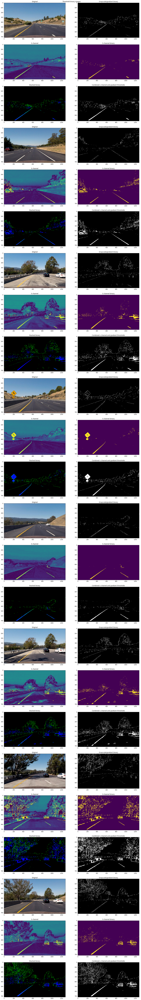

In [5]:
# List to hold the combined binary images
combined_binary_images = []

# Make a grid figure to display the test images (original_undistorted, gradiant_binary, s_channel, stacked, combined)
test_images_binary_grid = plt.figure(figsize=(20, 150))
plt.title('Threshold binary images')
plt.axis('off')
current_pos = 1
colums = 2
rows = 24

# Go through all images in the test_images folder
for img in undistored_test_images:
    
    # binary from sobel in x direction of the GRAYSCALE image
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobelx = np.uint8(255*abs_sobelx/np.max(abs_sobelx))    
    threshold_min = 40
    threshold_max = 80
    sxbinary = np.zeros_like(scaled_sobelx)
    sxbinary[(scaled_sobelx >= threshold_min) & (scaled_sobelx <= threshold_max)] = 1
    
    # binary from the color channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    scaled_s_channel = np.uint8(255*s_channel/np.max(s_channel))
    s_threshold_min = 150
    s_threshold_max = 255
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_threshold_min) & (s_channel <= s_threshold_max)] = 1
    
    # Stack the grayscale gradiant binary and the s channel binary
    stacked_binary = np.dstack((np.zeros_like(sxbinary), sxbinary, s_binary)) * 255
    
    # Combine the binaries into one binary
    combined_binary = np.zeros_like(sxbinary)
    combined_binary[(sxbinary == 1) | (s_binary == 1)] = 1
    combined_binary_images.append(combined_binary)
    
    test_images_binary_grid.add_subplot(rows, columns, current_pos)
    plt.imshow(img)
    plt.title('Original')
    test_images_binary_grid.add_subplot(rows, columns, current_pos+1)
    plt.imshow(sxbinary, cmap='gray')
    plt.title('Grayscale/gradiant binary')
    test_images_binary_grid.add_subplot(rows, columns, current_pos+2)
    plt.imshow(s_channel)
    plt.title('S channel')
    test_images_binary_grid.add_subplot(rows, columns, current_pos+3)
    plt.imshow(s_binary)
    plt.title('S channel binary')
    test_images_binary_grid.add_subplot(rows, columns, current_pos+4)
    plt.imshow(stacked_binary)
    plt.title('Stacked binary')
    test_images_binary_grid.add_subplot(rows, columns, current_pos+5)
    plt.imshow(combined_binary, cmap='gray')
    plt.title('Combined s channel and gradiant thresholds')
    

    current_pos += 6
plt.show()

### Just the combined binary images

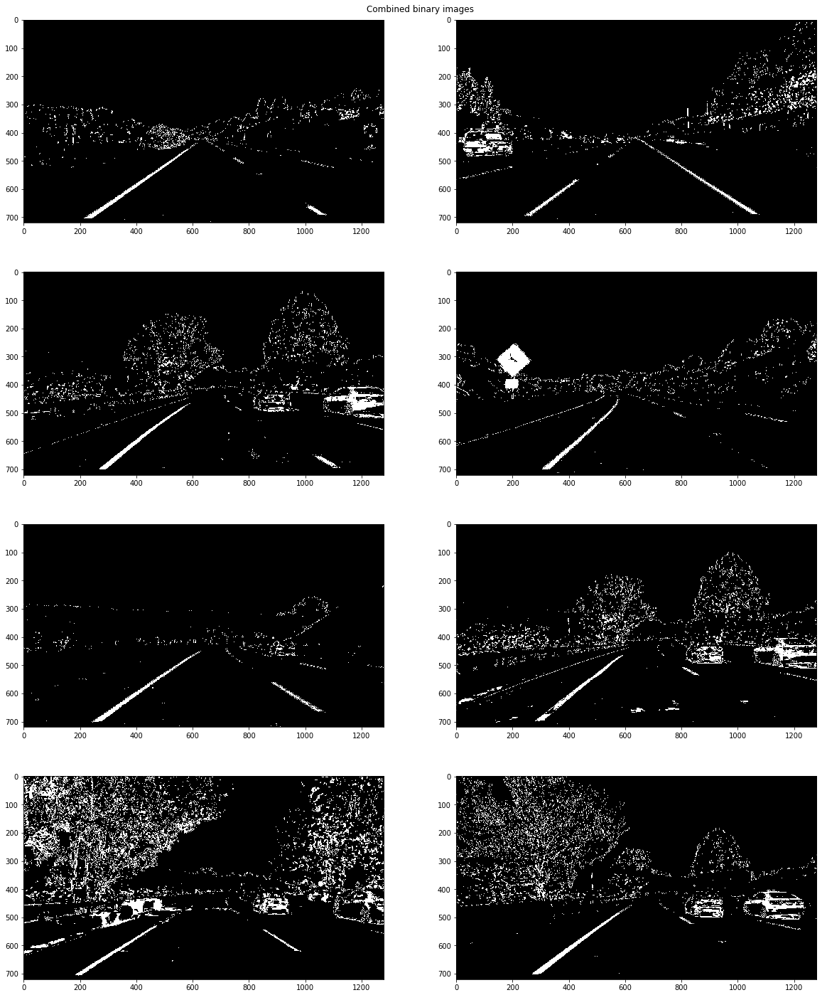

In [6]:
combined_images_binary_grid = plt.figure(figsize=(20, 25))
plt.title('Combined binary images')
plt.axis('off')
current_pos = 1
colums = 2
rows = 4

for img in combined_binary_images:
    combined_images_binary_grid.add_subplot(rows, columns, current_pos)
    
    plt.imshow(img, cmap='gray')
    current_pos += 1
plt.show()    

## 4. Apply a perspective transform to rectify binary image ("birds-eye view")

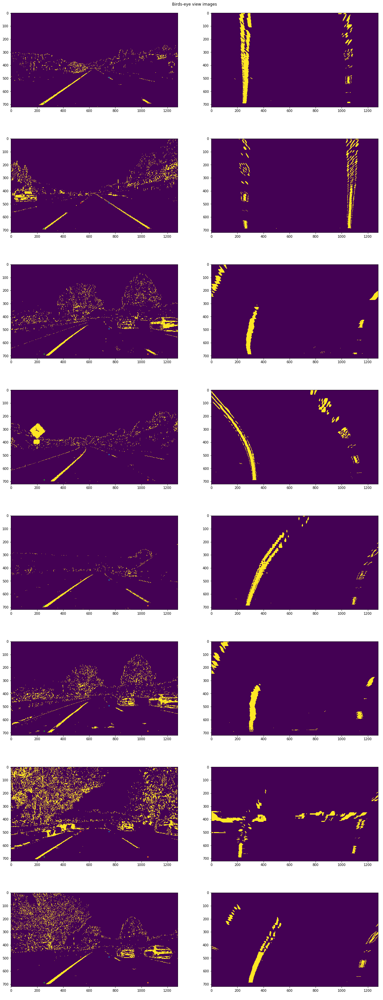

In [7]:
# Function to warp the image to birds-eye view
def birdseye_warp(img):
    img_size = (img.shape[1], img.shape[0])
    
    # Source coordinates
    src = np.float32(
    [[750, 492],
    [1050, 687],
    [255, 687],
    [535, 492]])
    
    # Destination coordinates
    dst = np.float32(
    [[1050, 492],
    [1050, 687],
    [255, 687],
    [255, 492]])
    
    # Transfomration matrix
    M = cv2.getPerspectiveTransform(src, dst)
    birdseye = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)
    
    return birdseye

birdseye_view_grid = plt.figure(figsize=(20, 55))
plt.title('Birds-eye view images')
plt.axis('off')
current_pos = 1
colums = 2
rows = 8

for img in combined_binary_images:
    
    birdseye_img = birdseye_warp(img)    
    
  
    
    birdseye_view_grid.add_subplot(rows, columns, current_pos)
    plt.imshow(img)
    
    # source image points on top of binary test image 
    plt.plot(750, 492, '.') # top right
    plt.plot(1050, 687, '.') # bottom right
    plt.plot(255, 687, '.')  # bottom left
    plt.plot(535, 492, '.') # top left
    
    birdseye_view_grid.add_subplot(rows, columns, current_pos+1)
    plt.imshow(birdseye_img)
    
    
    current_pos += 2
plt.show()
    

### Perspective transform on actual test images

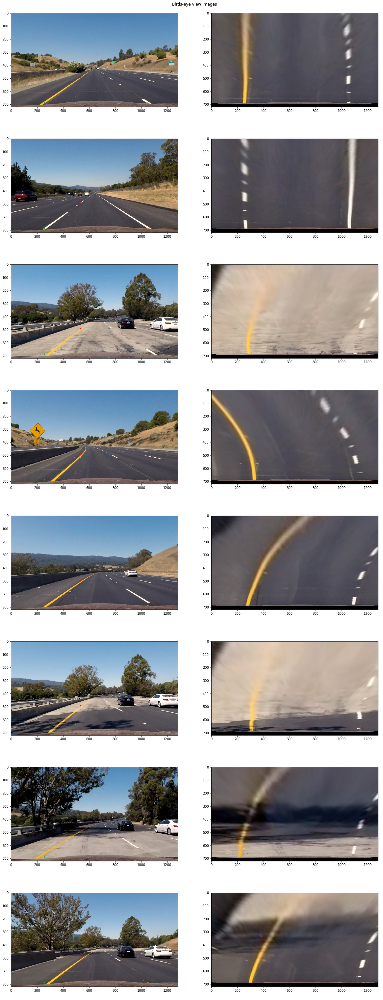

In [10]:
birdseye_view_grid = plt.figure(figsize=(20, 55))
plt.title('Birds-eye view images')
plt.axis('off')
current_pos = 1
colums = 2
rows = 8

for img in undistored_test_images:
    
    birdseye_img = birdseye_warp(img)    
    
  
    
    birdseye_view_grid.add_subplot(rows, columns, current_pos)
    plt.imshow(img)
    
    # source image points on top of binary test image 
    plt.plot(750, 492, '.') # top right
    plt.plot(1050, 687, '.') # bottom right
    plt.plot(255, 687, '.')  # bottom left
    plt.plot(535, 492, '.') # top left
    
    birdseye_view_grid.add_subplot(rows, columns, current_pos+1)
    plt.imshow(birdseye_img)
    
    
    current_pos += 2
plt.show()

## 5. Detect lane pixels and fit to find the lane boundary

## 6. Determine the curvature of the lane and vehicle position with respect to center.

## 7. Warp the detected lane boundaries back onto the original image

## 8. Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position